# Whitening a black box: how to interpret a ML model

### Investigated methods

* **Partial Dependency Plots** (PDP): [theory](https://christophm.github.io/interpretable-ml-book/pdp.html), [PDPBox](https://pdpbox.readthedocs.io/en/latest/index.html) and on [GitHub](https://github.com/SauceCat/PDPbox)
* **Individual Conditional Expectation** (ICE): [theory](https://christophm.github.io/interpretable-ml-book/ice.html), [PDPBox](https://pdpbox.readthedocs.io/en/latest/index.html) and on [GitHub](https://github.com/SauceCat/PDPbox)
* **Permutation Feature Importance**: [theory](https://christophm.github.io/interpretable-ml-book/feature-importance.html), [eli5](https://eli5.readthedocs.io/en/latest/autodocs/sklearn.html#module-eli5.sklearn.permutation_importance) 
* **Trees Ensembles Features Contribution**: [theory](http://blog.datadive.net/interpreting-random-forests/), [eli5](https://eli5.readthedocs.io/en/latest/autodocs/sklearn.html#module-eli5.sklearn.explain_prediction)
* **Local interpretable model-agnostic explanations** (LIME): [theory](https://christophm.github.io/interpretable-ml-book/lime.html), [theory](https://www.oreilly.com/learning/introduction-to-local-interpretable-model-agnostic-explanations-lime), [tutorial](https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html), [GitHub](https://github.com/marcotcr/lime)
* **SHAP (SHapley Additive exPlanations)**: [theory](https://christophm.github.io/interpretable-ml-book/shapley.html), [theory](https://christophm.github.io/interpretable-ml-book/shap.html), [shap](https://github.com/slundberg/shap), [very good intro level blog post](https://medium.com/@gabrieltseng/interpreting-complex-models-with-shap-values-1c187db6ec83)

### Useful links
* Awesome blog post on Interpreting a ML model: [here](http://savvastjortjoglou.com/intrepretable-machine-learning-nfl-combine.html)
* Adult dataset description: [here](https://archive.ics.uci.edu/ml/datasets/Adult)
* Adult dataset modeling (R): [here](https://rstudio-pubs-static.s3.amazonaws.com/235617_51e06fa6c43b47d1b6daca2523b2f9e4.html)

### Still unstable methods 
* Accumulated Local Effects (ALE) Plots (*pip version not up-to-date; author admitting library needs more work*): [theory](https://christophm.github.io/interpretable-ml-book/ale.html), [ALEPython](https://github.com/blent-ai/ALEPython)
* Scoped Rules (Anchors) from the creators of LIME (*pip version not up-to-date; issues with outdated dependencies, e.g sklearn*): [theory](https://christophm.github.io/interpretable-ml-book/anchors.html), [GitHub](https://github.com/marcotcr/anchor)

### *Note*
I really struggled to have the `sklearn`, `XGBoost` and `CatBoost` APIs function smoothly with the `PDPBox`, `eli5`, `lime` and `shap` packages. Some just accept `pd.DataFrame` but then the explanation part is compatible with `np.array` only, or the other way around. Also, not all classifiers output ptobabilities by default. For `XGBoost` a score is produced and it needs to be fed into a sigmoid function to convert it into a probability. Nothing dramatic per se. It just means some extra care must be used when turning towards those methods.

For the time being, I managed to get both `sklearn` and `XGBoost` to work with all the relevant explanation-related packages, with the caveat that `PDPBox` only accepts models tained on `pd.DataFrame`. For `CatBoost`, instead, I could not get a `lime` pipeline to work, even though `shap` does just fine.  

### References
```
Molnar, Christoph. "Interpretable machine learning. A Guide for Making Black Box Models Explainable", 2019. 
https://christophm.github.io/interpretable-ml-book/.
```

### Imports

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

from interpretable_ml_utils import *

# UNCOMMENT THE FOLLOWING LINE IF YOU WANT TO BENEFIT FROM SHAP NOTEBOOK INTERACTIVITY
#shap.initjs()

path = Path("C:/Users/francesco.pochetti/Notebooks/data/Varied")

### Loading and processing the UCI adult dataset

In [2]:
fname = path/"adult.feather"
if not os.path.isfile(fname):
    cols = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 
            'marital_status', 'occupation', 'relationship', 'race', 'sex', 
            'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']
    df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', 
                     names=cols)
    df.to_feather(fname)
else: 
    df = pd.read_feather(fname)

In [3]:
df.shape

(32561, 15)

In [4]:
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K


In [5]:
missing_values(df)

,Total,Percent


In [6]:
features = ['age', 'workclass', 'education', 'marital_status', 'occupation', 
            'relationship', 'race', 'sex', 'hours_per_week', 'native_country',
            'capital_gain', 'capital_loss']

In [7]:
for c in features+['income']:
    if not is_numeric_dtype(df[c]):
        df[c] = df[c].str.strip()
        df = reduce_cardinality(df, c)

In [8]:
raw_train, raw_valid = train_test_split(df[features+['income']], train_size=0.8, random_state=1234)
raw_train.shape, raw_valid.shape

((26048, 13), (6513, 13))

In [9]:
display_all(raw_train.head())

,29187,23535,14450,2727,18474
age,31,59,21,32,20
workclass,Private,?,Private,Private,Private
education,HS-grad,Bachelors,HS-grad,HS-grad,Some-college
marital_status,Divorced,Married-civ-spouse,Never-married,Never-married,Never-married
occupation,Other-service,?,Adm-clerical,Adm-clerical,Adm-clerical
relationship,Unmarried,Husband,Not-in-family,Not-in-family,Own-child
race,White,White,White,White,White
sex,Female,Male,Female,Female,Female
hours_per_week,99,40,40,40,20
native_country,United-States,United-States,United-States,United-States,United-States


### One-hot-encoding categories (needed for PDPs) and splitting data into train/validation

In [10]:
cats = train_cats(raw_train)  
X_train, y_train, nas = proc_df(raw_train, y_fld='income', max_n_cat=15)

apply_cats(raw_valid, raw_train)
X_valid, y_valid, _ = proc_df(raw_valid, y_fld='income', na_dict=nas, max_n_cat=15)
feats = list(X_train.columns)

raw_train.shape, raw_valid.shape, X_train.shape, X_valid.shape

((26048, 13), (6513, 13), (26048, 56), (6513, 56))

In [11]:
cats['workclass']

['?', 'Local-gov', 'Private', 'Self-emp-not-inc', 'State-gov', 'UNK']

### Training model on one-hot-encoded data

In [12]:
clf = xgb.XGBClassifier(learning_rate=0.03, n_estimators=300, n_jobs=-1)
clf.fit(X_train, y_train)
_ = print_report(clf, X_valid, y_valid, t=0.5, cal=False, roc=False, 
                 conf=False, classes=cats['income'])

#clf = RandomForestClassifier(n_estimators=150, min_samples_leaf=5, n_jobs=-1)
#clf.fit(X_train, y_train)
#_ = print_report(clf, X_valid, y_valid, t=0.5, cal=False, roc=False, 
#                 conf=False, classes=cats['income'])

AUC valid: 0.9069511545106526 
F1 valid: 0.649270913277053
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      4985
           1       0.78      0.55      0.65      1528

    accuracy                           0.86      6513
   macro avg       0.83      0.75      0.78      6513
weighted avg       0.85      0.86      0.85      6513



## Permutation-based feature importance

The questions this approach answers are: 
* How much does the performance of the model decrease on average when we random shuffle one feature at a time (Y-axis in the chart below shows AUC)?
* Which features affect performance the most?

### Advantages ([source](https://christophm.github.io/interpretable-ml-book/feature-importance.html#advantages-9))
> * Nice interpretation: Feature importance is the increase in model error when the feature’s information is destroyed.
> * The importance measure automatically takes into account all interactions with other features. 

### Disadvantages ([source](https://christophm.github.io/interpretable-ml-book/feature-importance.html#disadvantages-9))
> * It is very unclear whether you should use training or test data to compute the feature importance.
> * If features are correlated, the permutation feature importance can be biased by unrealistic data instances.
> * Adding a correlated feature can decrease the importance of the associated feature by splitting the importance between both features.

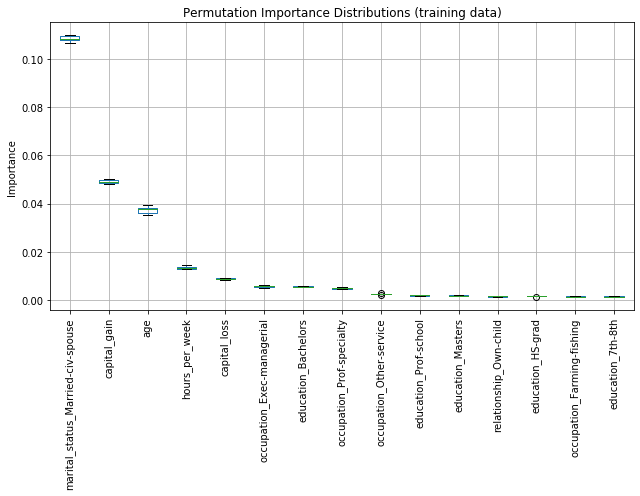

,feature,weight,std
0,marital_status_Married-civ-spouse,0.108362,0.001111
1,capital_gain,0.049074,0.000693
2,age,0.037389,0.001519
3,hours_per_week,0.013571,0.000667
4,capital_loss,0.008937,0.000274
5,occupation_Exec-managerial,0.005758,0.000382
6,education_Bachelors,0.005716,0.000193
7,occupation_Prof-specialty,0.004898,0.000319
8,occupation_Other-service,0.002495,0.000199
9,education_Prof-school,0.002048,0.000153


In [13]:
try: imp = get_permutation_imp(clf, X_train, y_train, feats=feats)
except: imp = get_permutation_imp(clf, X_train.values, y_train, feats=feats) 

## Gain-based feature importance

Methodology currently implemented in scikit-learn. *Source [SO](https://stackoverflow.com/questions/15810339/how-are-feature-importances-in-randomforestclassifier-determined)*
> It is sometimes called "gini importance" or "mean decrease impurity" and it is defined as the total decrease in node impurity (weighted by the probability of reaching that node (which is approximated by the proportion of samples reaching that node)) averaged over all trees of the ensemble

### Advantages
Compared to permutation-based feature importance, this method comes at no additional cost (the gains are directly calculated as part of training) and does not suffer from the drawbacks of having potentially correlated features, as datapoints are not shuffled.


### Disadvantages
Probably the biggest disadvantage is the fact that the absolute importances are less interpretable, compared to the more concise and transparent increase in error rate we had before.  

### Note
Note that, as expected, the two illustrated feature importance methods yield slightly different results in terms of the ordering the top variables.

In [14]:
get_styled_feat_importance(clf, feats, 15)

Weight,Feature
0.2949,marital_status_Married-civ-spouse
0.0747,occupation_Prof-specialty
0.0608,capital_gain
0.0543,occupation_Exec-managerial
0.0396,education_Bachelors
0.0365,education_Masters
0.0316,occupation_Other-service
0.0267,hours_per_week
0.0263,education_HS-grad
0.0241,relationship_Own-child


## Partial Dependency Plots (PDP) + Individual Conditional Expectation (ICE)

The idea behind **PDP** is to check the relationship between the dependent variable and a feature of interest, in an approach allowing to isolate the dependence of the output wrt an input, all other things being equal.

This is  achieved in the following way:
1. For a numerical variable, select N values which split the feature in quantile-spaced or equi-distance-spaced intervals. For a categorical variable, it suffices to identify the unique levels present in the dataset.
2. For each one of the N values, e.g. `x`:
    1. Replace the entire feature in the dataset with *x*, keeping the other variables fixed.
    2. Run the newly created dataset through the model and record predictions.
4. Plot predictions (Y-axis) over the N values in #1 (X-axis). 

Say that your dataset is composed of `n` data points. Each time you run 2B, you'd get `n` predictions, e.g. you'd come up with N x `n` predictions at the end of the procedure.

Now, you have two options:
1. Plotting `n` lines over N data points on the X-axis. This is what **ICE** plots look like.
2. Plotting 1 average line over N data points on the X-axis. This is what **PDP** plots look like.

The charts below show both all lines and the average at the same time.

### Advantages ([source](https://christophm.github.io/interpretable-ml-book/pdp.html#advantages-5), [source](https://christophm.github.io/interpretable-ml-book/ice.html#advantages-6))

> * The computation of partial dependence plots is intuitive: the partial dependence function at a particular feature value represents the average prediction if we force all data points to assume that feature value.
> * If the feature for which you computed the PDP is not correlated with the other features, then the PDPs perfectly represent how the feature influences the prediction on average. In the uncorrelated case, the interpretation is clear.
> * Unlike partial dependence plots, ICE curves can uncover heterogeneous relationships.


### Disadvantages ([source](https://christophm.github.io/interpretable-ml-book/pdp.html#disadvantages-5), [source](https://christophm.github.io/interpretable-ml-book/ice.html#disadvantages-6))
> * The realistic maximum number of features in a partial dependence function is two.
> * The assumption of independence is the biggest issue with PD plots.
> * To meaningfully plot both PDPs and ICE for categorical variables, the variable must be one-hot-encoded. This is a constraint as tree-ensemble algorithms (the de-facto go-to solution in the non-deep-learning world) can easily handle features which are not encoded in this way. 


**WARNING!** As you notice from the first plot below (`capital_gain`), the technique does not work for highly skewed features. I could not manage to get `PDPBox` to reduce the range of the variable in question, cutting high quantiles.

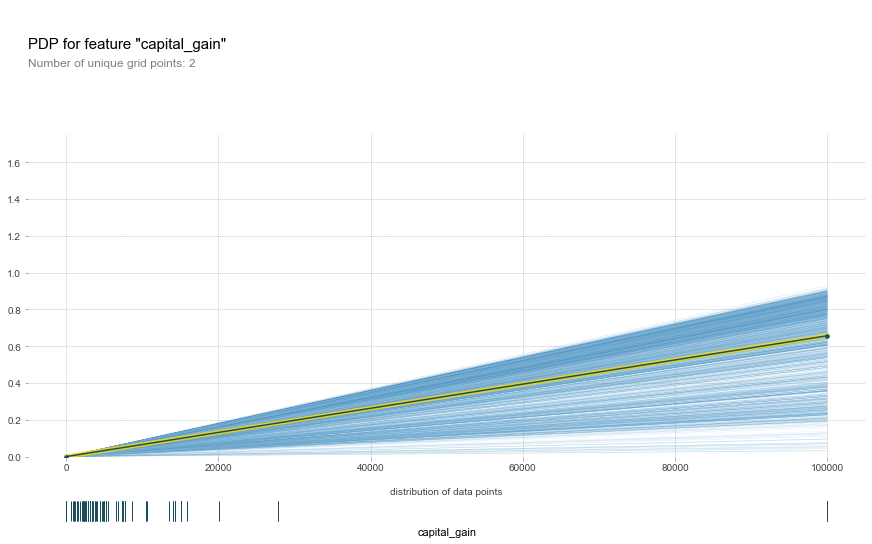

In [15]:
plot_pdp(clf, X_valid.sample(2000), feats, 'capital_gain')

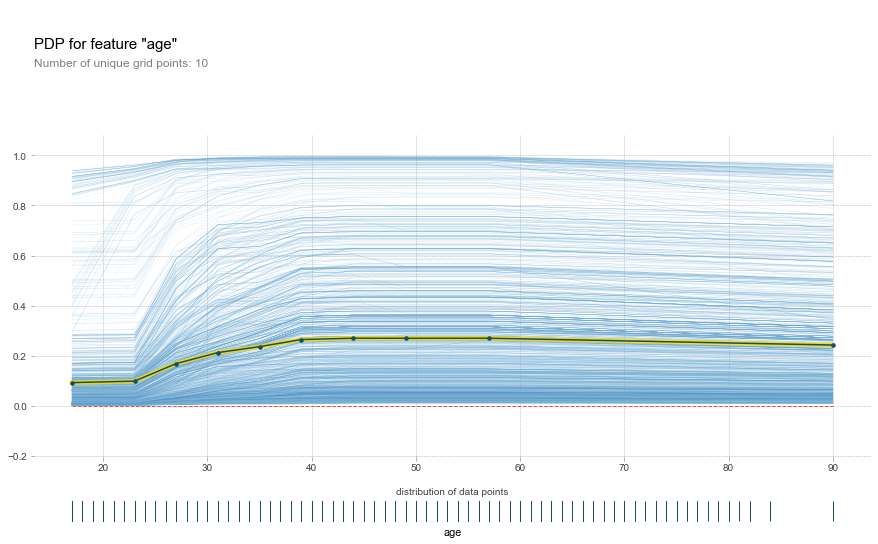

In [16]:
plot_pdp(clf, X_valid.sample(2000), feats, 'age', center=False)

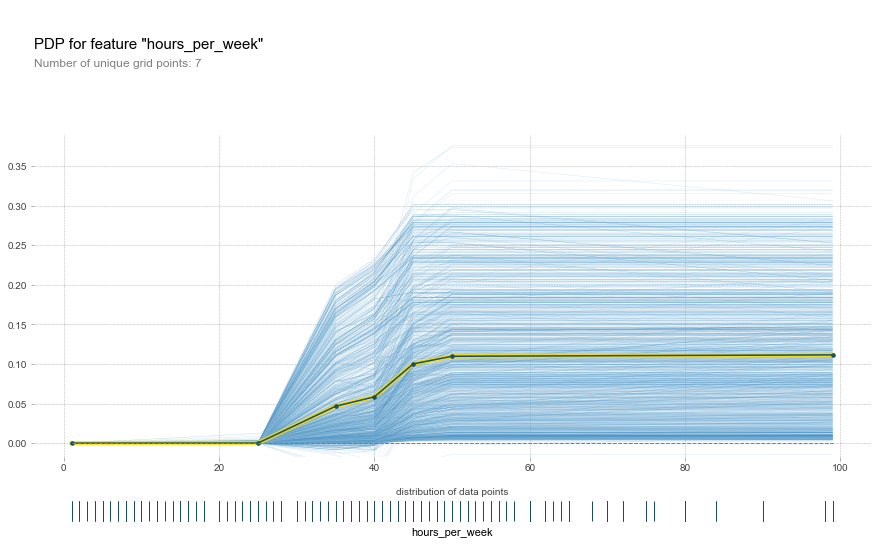

In [17]:
plot_pdp(clf, X_valid.sample(2000), feats, 'hours_per_week')

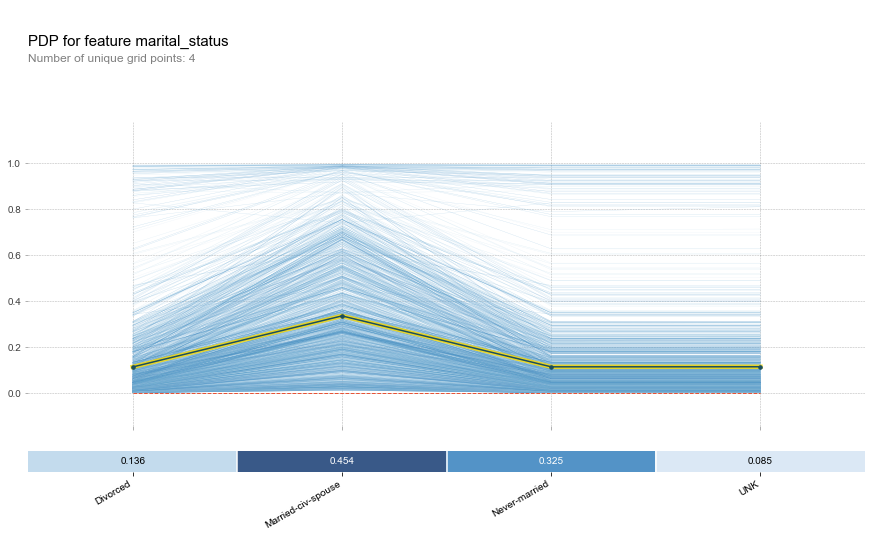

In [18]:
cat = 'marital_status'
f = [c for c in feats if c.startswith(cat)]
if len(f)>1: plot_pdp(clf, X_valid.sample(2000), feats, f, classes=cats[cat], plot_params={'title': f'PDP for feature {cat}'}, center=False)

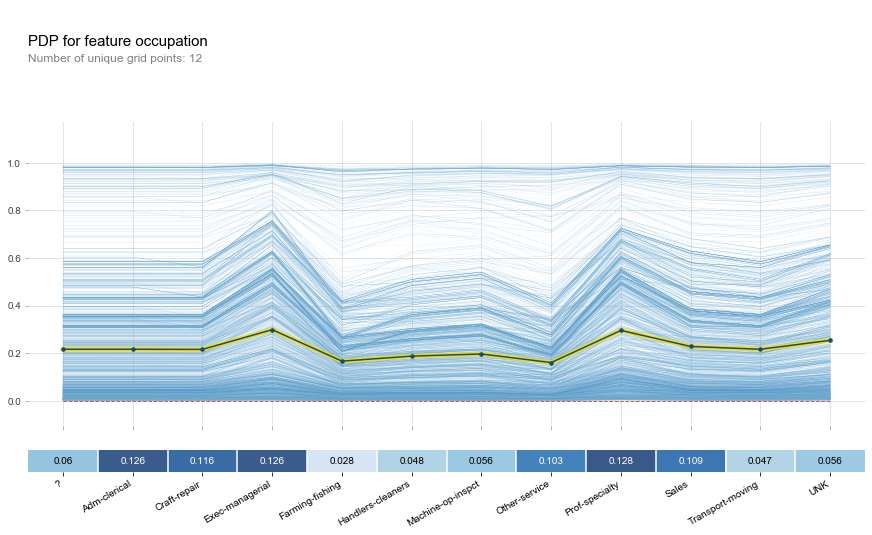

In [19]:
cat = 'occupation'
f = [c for c in feats if c.startswith(cat)]
if len(f)>1: plot_pdp(clf, X_valid.sample(2000), feats, f, classes=cats[cat], plot_params={'title': f'PDP for feature {cat}'}, center=False)

### Training model on NOT one-hot-encoded data and...

In [20]:
cats = train_cats(raw_train)
X_train, y_train, nas = proc_df(raw_train, y_fld='income', max_n_cat=None)

apply_cats(raw_valid, raw_train)
X_valid, y_valid, _ = proc_df(raw_valid, y_fld='income', na_dict=nas, max_n_cat=None)
feats = list(X_train.columns)

raw_train.shape, raw_valid.shape, X_train.shape, X_valid.shape

((26048, 13), (6513, 13), (26048, 12), (6513, 12))

Notice that in the below cell, in the case of `XGBoost`, we call `clf.fit(X_train.values, y_train)`, e.g. we fit on `np.arrays`, and not on `pd.DataFrame`. This is due to downstream-used packages (`lime`, `eli5`, `shap`) not always being compatible with `pandas` and `XGBoost` or `CatBoost`. The `sklearn` API is always compatible with `pandas`, though.

In [21]:
clf = xgb.XGBClassifier(learning_rate=0.03, n_estimators=300, n_jobs=-1)
clf.fit(X_train.values, y_train)
_ = print_report(clf, X_valid.values, y_valid, t=0.5, cal=False, roc=False, 
                 conf=False, classes=cats['income'])

#clf = RandomForestClassifier(n_estimators=150, min_samples_leaf=5, n_jobs=-1)
#clf.fit(X_train, y_train)
#_ = print_report(clf, X_valid, y_valid, t=0.5, cal=False, roc=False, 
#                 conf=False, classes=cats['income'])

AUC valid: 0.9047545778697349 
F1 valid: 0.6396327467482785
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      4985
           1       0.77      0.55      0.64      1528

    accuracy                           0.86      6513
   macro avg       0.82      0.75      0.77      6513
weighted avg       0.85      0.86      0.85      6513



### ... showing feature importances as before

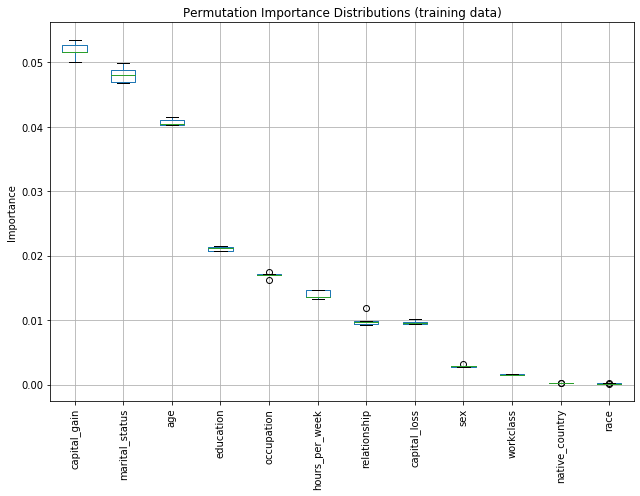

,feature,weight,std
0,capital_gain,0.051877,0.001179
1,marital_status,0.048065,0.001179
2,age,0.040742,0.000520
3,education,0.021083,0.000325
4,occupation,0.016995,0.000420
5,hours_per_week,0.013954,0.000576
6,relationship,0.010013,0.000934
7,capital_loss,0.009647,0.000272
8,sex,0.002908,0.000149
9,workclass,0.001521,0.000091


In [22]:
imp = get_permutation_imp(clf, X_train.values, y_train, feats=feats)

In [23]:
get_styled_feat_importance(clf, feats)

Weight,Feature
0.3290,relationship
0.1466,marital_status
0.1243,capital_gain
0.0928,occupation
0.0592,education
0.0551,hours_per_week
0.0540,capital_loss
0.0494,age
0.0404,sex
0.0260,workclass


## Features contributions to individual predictions: the [treeinterpreter](http://blog.datadive.net/interpreting-random-forests/) approach

The following approach is not known in the community under a specific name and it does not come with a paper. 

Even though not highly advertised, it is incredibly powerful, and got integrated (in an independent implementation) within the [eli5](https://eli5.readthedocs.io/en/latest/overview.html) library. 

[Ando Saabas](https://www.linkedin.com/in/ando-saabas-1a86102/) proposed the method in [this](http://blog.datadive.net/interpreting-random-forests/) [series](http://blog.datadive.net/random-forest-interpretation-with-scikit-learn/) of posts. The idea is that we can decompose the contribution of each feature to a specific prediction by following the path from the root of the tree to the node where the instance of interest resides. This is done by recording, at each split of the feature space, the difference in the proportion of the positive class (in case of classification) between the parent and the child node and assigning that difference to the variable in question. If we start from the root, the percentage of the positive class would just represent the average across the entire training set. Let's assume this is 70%. Now assume that the first split happens on feature `X_1`, that our instance of interest sits on the right branch of the tree and that within this subset the percentage of the positive class is 80%. Then we can safely state that `X_1` drives an increase in probability of 10%. Imagine doing this until the tree is fully grown and averaging that out across all trees (in case of a forest).   

This is how the method works in a nutshell.

The contributions, by definition, add up to the final model's outcome, making them easy to interpret and to visualize. Both a tabular form, as `eli5` proposes, and a more business-oriented waterfall chart, are nice ways of doing so.

### *Note*
This method relies on the metrics which get actually computed at each tree's node. 

In case of `XGBoost`, the algorithm calculates a [score](https://xgboost.readthedocs.io/en/latest/tutorials/model.html#the-structure-score) which cannot direcly be interpreted as a probability, as happening in RandomForest, so beware of the numbers `eli5` displays. 

Prediction explanation for ID: 20150; Probability of event (y=1): 0.6039999723434448
Model used: <class 'xgboost.sklearn.XGBClassifier'>


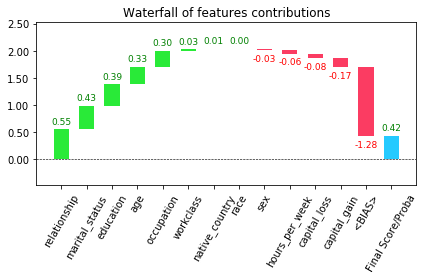

In [24]:
# id = X_valid.sample().index.values[0]

# fixing the ID value for illustration purposes
id = 20150 
explain_pred_contrib(id, clf, X_valid, feats, cats=cats, waterfall={'rotation_value':60, 'threshold': None})

## Local interpretable model-agnostic explanations (LIME)

The principle behind LIME is based on fitting a local explainable model (e.g. a linear regression for instance) on the predictions of the black-box model. First thing to notice, LIME does not fit on the actuals, but on the black-models outputs. Those are the ones we have to explain, after all.

> The recipe for training local surrogate models:
> * Select your instance of interest for which you want to have an explanation of its black box prediction.
> * Perturb your dataset and get the black box predictions for these new points.
> * Weight the new samples according to their proximity to the instance of interest.
> * Train a weighted, interpretable model on the dataset with the variations.
> * Explain the prediction by interpreting the local model.

[Source](https://christophm.github.io/interpretable-ml-book/lime.html)

### Advantages ([source](https://christophm.github.io/interpretable-ml-book/lime.html#advantages-11))
> * Explanations are short (= selective) and possibly contrastive.
> * It works for tabular data, text and images.
> * The fidelity measure (how well the interpretable model approximates the black box predictions) gives us a good idea of how reliable the interpretable model is.

### Disadvantages ([source](https://christophm.github.io/interpretable-ml-book/lime.html#disadvantages-11))
> * The correct definition of the neighborhood is a very big, unsolved problem when using LIME with tabular data. In my opinion it is the biggest problem with LIME and the reason why I would recommend to use LIME only with great care. [...] LIME currently uses an exponential smoothing kernel to define the neighborhood. A smoothing kernel is a function that takes two data instances and returns a proximity measure. The kernel width determines how large the neighborhood is: A small kernel width means that an instance must be very close to influence the local model, a larger kernel width means that instances that are farther away also influence the model. If you look at LIME’s Python implementation (file lime/lime_tabular.py) you will see that it uses an exponential smoothing kernel (on the normalized data) and the kernel width is 0.75 times the square root of the number of columns of the training data.
> * Another really big problem is the instability of the explanations. In an [article](https://arxiv.org/abs/1806.08049) the authors showed that the explanations of two very close points varied greatly in a simulated setting.

> **Conclusion**: Local surrogate models, with LIME as a concrete implementation, are very promising. But the method is still in development phase and many problems need to be solved before it can be safely applied.


**WARNING! The below explanation makes, unfortunately, no sense, showing LIME's limitations. I decided to keep it for illustration purposes.**

When asking to explain an instance, the LIME library produces 3 outputs (see below):
* ***Left*** (Output Probabilities): those are the probabilities of the event (`>50K`) and non-event (`<=50K`) occuring.
* ***Center***: those are the top 5 reasons behind the prediction. As also discussed in [this](https://marcotcr.github.io/lime/tutorials/Tutorial%20-%20continuous%20and%20categorical%20features.html#Explaining-predictions) tutorial, the purpose of the bar chart is to show which variables are pushing the prediction in the direction of which class. In the case of the  first blue `capital_gain` bar extending to the left of the black vertical line, if `capital_gain` would not be `<=0` (it is `0` for this specific data point), the probability of the event `>50K` would be `0.63` higher. Differently stated, `capital_gain<=0` pushes the prediction towards the non-event by `0.63`. The second orange bar, instead, can be interpreted as: if `marital_status` would have been different than `Married-civ-spouse`, the probability of the event would be `0.13` lower, so this feature is acting in favour of `>50K`. Note that this explanation contradicts the prediction of the person earning more than 50K happening with probability 60%. Another resource to look at to understand how to interpret those numbers is the official LIME Github repo: the [screenshot](https://github.com/marcotcr/lime#screenshots) sections provides a couple of interesting examples.
* ***Right***: those are just the actual values the top 5 features hold for the instance in question.

An interesting fact to call out is the significant difference between LIME local prediction and the black-box model prediction. There is no guarantee those two would be equal, but still, such a big difference should hold us back from trusting the explanations as they might be inconsistent, as is actually the case.

In [25]:
explainer = get_lime_explainer(X_train, cats, feats, kernel_width=None)

In [26]:
exp = explain_pred_lime(id, clf, explainer, X_valid, num_features=5)

Model used: <class 'xgboost.sklearn.XGBClassifier'>
LIME local prediction: 0.2846695468893861; Model prediction: 0.6038179397583008; R2 score: 0.6850372854111757


**Fiddling around with `kernel_width` to try to get better explanations...**

If we reduce the `kernel_width` to `0.5` things improve a lot

In [27]:
explainer = get_lime_explainer(X_train, cats, feats, kernel_width=0.5)
exp = explain_pred_lime(id, clf, explainer, X_valid, num_features=5)

Model used: <class 'xgboost.sklearn.XGBClassifier'>
LIME local prediction: 0.4140323350257734; Model prediction: 0.6038179397583008; R2 score: 0.3646826645193938


In [28]:
#if 'XGB' in str(type(clf)): print(measure_lime_accuracy(clf, explainer, X_valid.sample(2000), num_features=5))

## SHAP (SHapley Additive exPlanations)

Quotes taken from [here](https://christophm.github.io/interpretable-ml-book/shap.html) and [here](https://christophm.github.io/interpretable-ml-book/shapley.html) 

**Goal**
> The goal of SHAP is to explain the prediction of an instance x by computing the contribution of each feature to the prediction. The SHAP explanation method computes Shapley values from coalitional game theory.[...] A prediction can be explained by assuming that each feature value of the instance is a “player” in a game where the prediction is the payout. Shapley values [...] tells us how to fairly [e.g. in an additive fashion] distribute the “payout” among the features. 

**Conditions Shapley values meet**
> [source](https://medium.com/@gabrieltseng/interpreting-complex-models-with-shap-values-1c187db6ec83) Consider the following scenario: a group of people are playing a game. As a result of playing this game, they receive a certain reward; how can they divide this reward between themselves in a way which reflects each of their contributions? There are a few things which everyone can agree on; meeting the following conditions will mean the game is `fair` according to Shapley values:
* [**Efficiency**] The sum of what everyone receives should equal the total reward
* [**Symmetry**] If two people contributed the same value, then they should receive the same amount from the reward
* [**Dummy**] Someone who contributed no value should receive nothing
* [**Additivity**] If the group plays two games, then an individual’s reward from both games should equal their reward from their first game plus their reward from the second game

**Intuition**
> An intuitive way to understand the Shapley value is the following illustration: The feature values enter a room in random order. All feature values in the room participate in the game (= contribute to the prediction). The Shapley value of a feature value is the average change in the prediction that the coalition already in the room receives when the feature value joins them.

> [source](https://medium.com/@gabrieltseng/interpreting-complex-models-with-shap-values-1c187db6ec83) Shapley values calculate the importance of a feature by comparing what a model predicts with and without the feature. However, since the order in which a model sees features can affect its predictions, this is done in every possible order, so that the features are fairly compared.

**Interpretation**
> The interpretation of the Shapley value for feature value `j` is: The value of the j-th feature contributed `ϕj` to the prediction of this particular instance compared to the average prediction for the dataset.

> Be careful to interpret the Shapley value correctly: The Shapley value is the average contribution of a feature value to the prediction in different coalitions. The Shapley value is NOT the difference in prediction when we would remove the feature from the model.

**What does the SHAP package offer?**
1. `Single instance force plots`
    > Each feature value is a force that either increases or decreases the prediction. The prediction starts from the baseline. The baseline for Shapley values is the average of all predictions. In the plot, each Shapley value is an arrow that pushes to increase (positive value) or decrease (negative value) the prediction. These forces balance each other out at the actual prediction of the data instance.
2. `Aggregated SHAP-based feature importance`: sort features based on mean absolute Shapley values.
3. `Instance-level SHAP-based feature importance`: sort features by aggregated SHAP-based importance and show instance-granular Shapley values dispersed on the y-axis.
4. `Clustering instances based on Shapley values`
5. `Dependence plots`: showing relationship between Shapley values of feature `j` and values of feature `j`, with additional possibility to colour code by the intensity of a second variable.


### Advantages ([source](https://christophm.github.io/interpretable-ml-book/shapley.html#advantages-13))

> * The difference between the prediction and the average prediction is fairly distributed among the feature values of the instance [e.g. it mst add up to the that difference] – the Efficiency property of Shapley values. This property distinguishes the Shapley value from other methods such as LIME. LIME does not guarantee that the prediction is fairly distributed among the features.
> * The Shapley value is the only explanation method with a solid theory. The axioms – efficiency, symmetry, dummy, additivity – give the explanation a reasonable foundation. Methods like LIME assume linear behavior of the machine learning model locally, but there is no theory as to why this should work.

### Disadvantages ([source](https://christophm.github.io/interpretable-ml-book/shapley.html#disadvantages-13))

> * The Shapley value requires a lot of computing time.
> * The Shapley value can be misinterpreted. The Shapley value of a feature value is not the difference of the predicted value after removing the feature from the model training. The interpretation of the Shapley value is: Given the current set of feature values, the contribution of a feature value to the difference between the actual prediction and the mean prediction is the estimated Shapley value.

In [29]:
shap_explainer = get_shap_explainer('tree', clf)
shap_values = get_shap_values(shap_explainer, X_valid)

Model used: <class 'xgboost.sklearn.XGBClassifier'>


#### SHAP force plots

The red "forces" in the below plot push the probability of the event high, whereas the "blue" ones work against them pushing in the opposite direction. Starting from the `base_value`, all forces add up to the final prediction.

In [30]:
# `link='logit'` only for classifiers such as XGBoost not producing probs directly
show_shap(shap_explainer.expected_value, shap_values, X_valid, id, cats=cats, 
          link='logit', matplotlib=False, feats=feats)

Printing top/bottom 5 features by SHAP values


,SHAP value,Feat value
marital_status,0.488455,Married-civ-spouse
relationship,0.447789,Husband
education,0.373692,Masters
age,0.368265,48
occupation,0.320931,Exec-managerial
...,...,...
workclass,-0.006547,Private
sex,-0.010044,Male
hours_per_week,-0.064090,40
capital_loss,-0.066898,0


#### Training a CatBoost classifier

In [31]:
cat_cols = [c for c in cats.keys() if c!='income']

In [32]:
train_data = Pool(
    data=X_train,
    label=y_train,
    cat_features=cat_cols
)
holdout_data = Pool(
    data=X_valid,
    label=y_valid,
    cat_features=cat_cols
)

In [33]:
clf_c = CatBoostClassifier(
    iterations=100,
    random_seed=random_state,
    learning_rate=0.1,
    custom_loss=['AUC']
)

_ = clf_c.fit(train_data, eval_set=holdout_data, plot=True, verbose=False)

#clf_c.fit(X_train, y_train, cat_features=cat_cols, eval_set=(X_valid, y_valid), plot=True, verbose=False)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [34]:
_ = print_report(clf_c, X_valid.values, y_valid, t=0.5, cal=False, 
                 roc=False, conf=False, classes=cats['income'])

AUC valid: 0.9094371465180883 
F1 valid: 0.6729996346364633
              precision    recall  f1-score   support

           0       0.89      0.94      0.91      4985
           1       0.76      0.60      0.67      1528

    accuracy                           0.86      6513
   macro avg       0.82      0.77      0.79      6513
weighted avg       0.86      0.86      0.86      6513



In [35]:
shap_explainer = get_shap_explainer('tree', clf_c)
shap_values = get_shap_values(shap_explainer, holdout_data)

Model used: <class 'catboost.core.CatBoostClassifier'>


#### [SHAP Feature Importance](https://christophm.github.io/interpretable-ml-book/shap.html#shap-feature-importance)

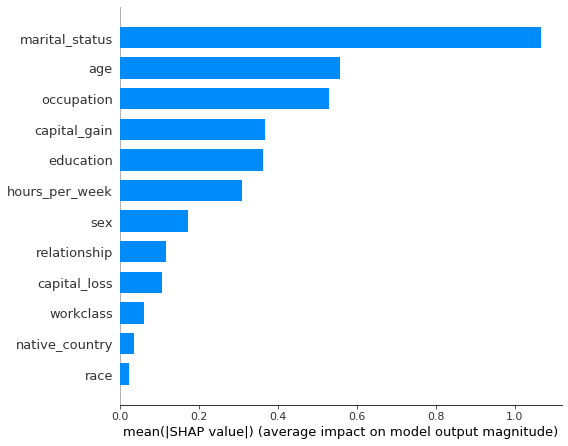

In [36]:
shap_imp = get_shap_feat_importance(shap_values, holdout_data, feats)

#### [SHAP Summary Plot](https://christophm.github.io/interpretable-ml-book/shap.html#shap-summary-plot)

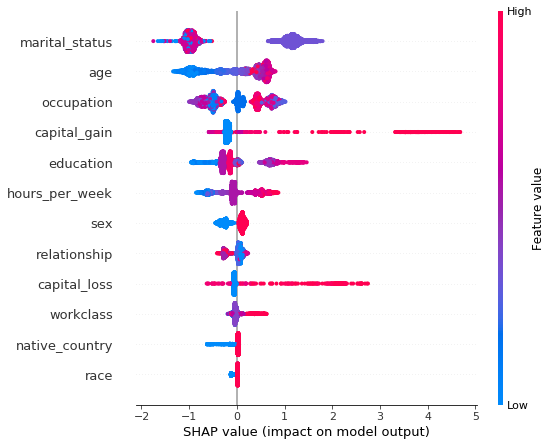

In [37]:
get_shap_feat_importance(shap_values, X_valid)

In [38]:
show_shap(shap_explainer.expected_value, shap_values, X_valid, id, cats=cats, 
          matplotlib=False, link='logit', feats=feats)

Printing top/bottom 5 features by SHAP values


,SHAP value,Feat value
marital_status,1.147313,Married-civ-spouse
education,0.853373,Masters
occupation,0.812718,Exec-managerial
age,0.691886,48
sex,0.108034,Male
...,...,...
workclass,0.008833,Private
race,0.007692,White
hours_per_week,-0.042783,40
capital_loss,-0.062791,0


**Checking additivity of Shapley values**

In [39]:
assert_shap_proba(clf_c, shap_explainer, shap_values, X_valid, id)

(0.7942827265979204, 0.7942827265979207)

#### [SHAP Clustering](https://christophm.github.io/interpretable-ml-book/shap.html#clustering-shap-values)

In [40]:
show_shap(shap_explainer.expected_value, shap_values, X_valid, id=None)

#### [SHAP Dependence Plot](https://christophm.github.io/interpretable-ml-book/shap.html#shap-dependence-plot) + [SHAP Interaction Values](https://christophm.github.io/interpretable-ml-book/shap.html#shap-interaction-values)

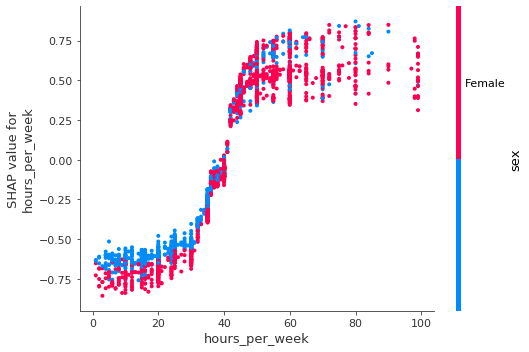

In [41]:
show_shap(shap_explainer.expected_value, shap_values, X_valid, id=None, x="hours_per_week", 
          y='sex', disp=raw_train)